# Using the Python API 

This tutorial shows how to use the MS²Rescore Python API for each step of the rescoring process individually. This is useful if you want to customize rescoring for your own Python workflow or if you want to understand how MS²Rescore works. Note that the full MS²Rescore workflow is also available from Python with the single function call `ms2rescore.rescore()`.

In [1]:
import logging
import plotly.io

logging.basicConfig(level=logging.DEBUG)
plotly.io.renderers.default = "plotly_mimetype+notebook"

## Reading and parsing peptide-spectrum matches

In [2]:
from psm_utils.io import read_file

from ms2rescore.report.charts import score_histogram

DEBUG:matplotlib:matplotlib data path: c:\Users\ralfg\git\ms2rescore-2\.venv\Lib\site-packages\matplotlib\mpl-data
DEBUG:matplotlib:CONFIGDIR=C:\Users\ralfg\.matplotlib
DEBUG:matplotlib:interactive is False
DEBUG:matplotlib:platform is win32
DEBUG:matplotlib:CACHEDIR=C:\Users\ralfg\.matplotlib
DEBUG:matplotlib.font_manager:Using fontManager instance from C:\Users\ralfg\.matplotlib\fontlist-v390.json


### Reading the PSM file

MS²Rescore is fully centered around the use of a `psm_utils` PSMList. This is a unified data representation of PSMs and their various attributes. Internally, it is simply a list of Pydantic data classes which represent PSMs. With the submodule `psm_utils.io`, we can read PSMs from a variety of file formats. Here, we will read a PSM file in the MaxQuant `msms.txt` format.

Importantly, for rescoring, the PSM file must contain all target and decoy PSMs, including PSMs that did not pass the FDR threshold. Most search engines must be specifically configured to return all PSMs without FDR filtering.


In [3]:
psm_list = read_file("msms.txt", filetype="msms")

For a quick inspection, we can format the PSM list as a Pandas dataframe and display the first few rows:

In [4]:
psm_list.to_dataframe().head()

,peptidoform,spectrum_id,run,collection,spectrum,is_decoy,score,qvalue,pep,precursor_mz,retention_time,ion_mobility,protein_list,rank,source,provenance_data,metadata,rescoring_features
0,"((A, None), (A, None), (A, None), (A, None), (...",4703,20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02,None,None,False,107.660,None,0.001517,478.77982,5.2007,None,"[P36578, H3BM89, H3BU31]",None,msms,{'msms_filename': 'msms.txt'},"{'Scan index': '3698', 'Sequence': 'AAAAAAALQA...",{}
1,"((A, None), (A, None), (A, None), (A, None), (...",13572,20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02,None,None,False,107.740,None,0.004931,915.15197,11.8470,None,"[O00410, E7ETV3, E7EQT5, C9JZD8]",None,msms,{'msms_filename': 'msms.txt'},"{'Scan index': '11885', 'Sequence': 'AAAAAEQQQ...",{}
2,"((A, None), (A, None), (A, None), (A, None), (...",13366,20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02,None,None,False,137.890,None,0.000493,957.85029,11.6900,None,"[O00410, E7ETV3, E7EQT5, C9JZD8]",None,msms,{'msms_filename': 'msms.txt'},"{'Scan index': '11695', 'Sequence': 'AAAAAEQQQ...",{}
3,"((A, None), (A, None), (A, None), (A, None), (...",505,20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02,None,None,False,22.641,None,0.142020,585.28653,0.5178,None,"[E9PJF0, E9PQW4, P27361]",None,msms,{'msms_filename': 'msms.txt'},"{'Scan index': '419', 'Sequence': 'AAAAAQGGGGG...",{}
4,"((A, None), (A, None), (A, None), (A, None), (...",6589,20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02,None,None,False,89.403,None,0.046504,823.87389,6.6105,None,[Q9P258],None,msms,{'msms_filename': 'msms.txt'},"{'Scan index': '5439', 'Sequence': 'AAAAAWEEPS...",{}


We can also directly plot the current PSM score distributions:

In [5]:
score_histogram(psm_list)

### Parsing modification names

While `psm_utils` could take care of all file parsing, we must still map the amino acid modification names that were used by the search engine to ones that are recognized by tools such as MS²PiP and DeepLC. This includes:

- Names as used in the Unimod or PSI-MOD databases
- Accession numbers as used in the Unimod or PSI-MOD databases
- Chemical formulas
- Mass shifts in Da

Note that, for instance DeepLC, requires a chemical formula to encode modifications. It will not be able to correctly encode modifications if only the mass shift is provided. It is therefore always preferred to provide a name/accession of a database where this information can be retrieved, or provide the chemical formula directly.

If a chemical formula is provided, other tools, such as MS²PIP, can use it to derive the correct mass shift.

To map modification names, simply provide a dictionary to the `psm_list.map_modifications` method.

In [ ]:
psm_list.rename_modifications({
    "gl": "Gln->pyro-Glu",
    "ox": "Oxidation",
    "ac": "Acetylation",
    "de": "Deamidation",
})

### Assigning fixed modifications

Some search engines (although not many) do not report fixed (sometimes also called static) modifications in their output PSM files. This is for instance the case for MaxQuant. With the method `psm_list.add_fixed_modifications`, we can systematically assign fixed modifications to their amino acid targets, as was done during the search. 

Note that `add_fixed_modifications` adds the modification in the ProForma 2.0 encoding as a prefix. To fully apply the modifications in the sequence, use the `psm_list.apply_fixed_modifications` method. A PSM `ACDE/2` would therefore go from `<[U:4]@C>ACDE/2` to `AC[U:4]DE/2`.



In [7]:
psm_list.add_fixed_modifications([("U:Carbamidomethyl", ["C"])])
psm_list.apply_fixed_modifications()

## Adding rescoring features

In [8]:
import pandas as pd

from ms2rescore.feature_generators.basic import BasicFeatureGenerator
from ms2rescore.feature_generators.ms2 import MS2FeatureGenerator
from ms2rescore.feature_generators.ms2pip import MS2PIPFeatureGenerator
from ms2rescore.feature_generators.deeplc import DeepLCFeatureGenerator

The PSM list, as read from a MaxQuant msms.txt file, currently does not contain any rescoring features:

In [9]:
pd.DataFrame(list(psm_list["rescoring_features"]))

""
0
1
2
3
4
...
35551
35552
35553
35554


Note that `psm_list[rescoring_features]` returns a Numpy array of dictionaries, but we can use Pandas to format it as a table. 

### Getting precursor information and MS2 spectra

Several feature generators require data from the spectrum files, such as retention times, precursor m/z values, or the MS2 spectra themselves. Rather than having each feature generator parse the spectrum files independently, MS2Rescore loads the required data once upfront using add_precursor_values. Here, we request the MS2 spectra and map them to the corresponding PSMs using a regex pattern that extracts the scan number from the spectrum identifier.

The following two parameters are especially important:

- `spectrum_path`: Path to the original spectrum files. This can be a single file, or a directory containing multiple files. The spectrum files must be in MGF or mzML format.
- `spectrum_id_pattern`: A regular expression pattern to extract the spectrum ID from the PSMs (see below).

A key aspect of generating spectrum-derived features is matching peptide identifications to the correct spectra. Many search engines alter spectrum identifiers in their output files, so the identifiers in the PSM file may not directly match those in the spectrum file. For example, MaxQuant reports scan numbers rather than full spectrum titles. If the spectrum files were converted to MGF with ThermoRawFileParser, we can extract these scan numbers from the spectrum TITLE entries using a regular expression pattern. The following pattern extracts the scan number from this example spectrum title:

```python
spectrum_id_pattern = r"scan=(\d+)"
```

```
mzspec=20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.raw: controllerType=0 controllerNumber=1 scan=2
```

We can test this with the first spectrum in the file:

In [10]:
from pyteomics.mgf import read as read_mgf

for spectrum in read_mgf("20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.mgf"):
    print(spectrum["params"]["title"])  # noqa T201
    break

mzspec=20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.raw: controllerType=0 controllerNumber=1 scan=2


In [11]:
import re
spectrum_id = re.match(r".*scan=(\d+)$", spectrum["params"]["title"]).group(1)
print(spectrum_id)  # noqa T201

2


We can use this scan number to retrieve its corresponding PSM:

In [12]:
example_psm = psm_list[psm_list["spectrum_id"] == spectrum_id][0]
example_psm

PSM(peptidoform=Peptidoform('ELMKLAPR/2'), spectrum_id='2', run='20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02', collection=None, spectrum=None, is_decoy=False, score=58.194, qvalue=None, pep=0.11486, precursor_mz=479.28114, retention_time=0.0054151, ion_mobility=None, protein_list=['K7ER25', 'K7EJY1', 'Q7Z3S7', 'E7EUE0'], rank=None, source='msms', provenance_data={'msms_filename': 'msms.txt'}, metadata={'Scan index': '0', 'Sequence': 'ELMKLAPR', 'Length': '8', 'Missed cleavages': '1', 'Modifications': 'Unmodified', 'Deamidation (NQ) Probabilities': '', 'Oxidation (M) Probabilities': '', 'Deamidation (NQ) Score Diffs': '', 'Oxidation (M) Score Diffs': '', 'Acetyl (Protein N-term)': '0', 'Deamidation (NQ)': '0', 'Gln->pyro-Glu': '0', 'Oxidation (M)': '0', 'Gene Names': 'CACNA2D4', 'Protein Names': 'Voltage-dependent calcium channel subunit alpha-2/delta-4;Voltage-dependent calcium channel subunit alpha-2-4;Voltage-dependent calcium channel subunit delta-4', 'Fragmentation': 'HCD', '

Using the correct `spectrum_id_pattern`, we can parse all spectra:

In [13]:
from ms2rescore.parse_spectra import MSDataType, add_precursor_values, annotate_spectra

available_ms_data = add_precursor_values(
    psm_list,
    {MSDataType.ms2_spectra},
    spectrum_path="20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.mgf",
    spectrum_id_pattern=r".*scan=(\d+)$",
)

annotate_spectra(psm_list, fragmentation_model="cidhcd", ms2_tolerance=20, ms2_tolerance_mode="ppm")


DEBUG:ms2rescore.parse_spectra:Missing required data types: MS2 spectra. Parsing from spectrum files.
INFO:ms2rescore.parse_spectra:Parsing precursor info from spectrum files...


Output()

DEBUG:ms2rescore.parse_spectra:Reading spectrum file: '20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.mgf'


INFO:ms2rescore.parse_spectra:Annotating MS2 spectra with fragment ions...


Now the PSM list contains the annotated MS2 spectrum with the matching spectrum ID, and the spectrum can be accessed as follows:

In [14]:
example_psm.spectrum

AnnotatedMS2Spectrum(identifier='mzspec=20161213_NGHF_DBJ_SA_Exp3A_HeLa_1ug_7min_15000_02.raw: controllerType=0 controllerNumber=1 scan=2', peaks=224, annotated=13)

### Basic features

Basic features from `BasicFeatureGenerator` can be added from any PSM list and contain simple feature, such as the search engine score, charge state, and absolute precursor mass error.

In [15]:
basic_fgen = BasicFeatureGenerator()
basic_fgen.add_features(psm_list)

INFO:ms2rescore.feature_generators.basic:Adding basic features to PSMs.


In [16]:
pd.DataFrame(list(psm_list["rescoring_features"]))

,charge_n,charge_1,charge_2,charge_3,charge_4,charge_5,charge_6,abs_ms1_error_ppm,search_engine_score,theoretical_mass,experimental_mass,mass_error,pep_len
0,2,0,1,0,0,0,0,1.137810,107.6600,955.546177,955.545087,-0.001090,11
1,3,0,0,1,0,0,0,0.598941,107.7400,2742.435725,2742.434081,-0.001644,25
2,3,0,0,1,0,0,0,0.573291,137.8900,2870.530688,2870.529041,-0.001647,26
3,2,0,1,0,0,0,0,0.929236,22.6410,1168.559595,1168.558507,-0.001088,14
4,2,0,1,0,0,0,0,0.666129,89.4030,1645.734325,1645.733227,-0.001098,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35551,2,0,1,0,0,0,0,0.782088,76.1000,1403.720846,1403.719747,-0.001099,12
35552,4,0,0,0,1,0,0,1.147761,114.6400,1906.996328,1906.994134,-0.002193,16
35553,2,0,1,0,0,0,0,0.813101,43.1240,1356.697652,1356.696547,-0.001105,11
35554,3,0,0,1,0,0,0,0.719097,23.5620,2276.122890,2276.121251,-0.001639,18


Now the PSMs contain a simple set of features.

Note that the charge state is present as both an integer and a one-hot encoded vector. This is because charge state can act as both a categorical and a numerical feature. Simply put, sometimes an effect increases or decreases with increasing charge state, and sometimes it is simply different for different charge states.

### MS²PIP features

MS²PIP is a machine learning tool that predicts the MS2 spectrum of a peptide given its sequence. It is previously identified MS2 spectra and their corresponding peptide sequences. Because MS²PIP uses the highly performant - but traditional - machine learning approach XGBoost, it can already produce accurate predictions even if trained on smaller spectral libraries. This makes MS²PIP a very flexible platform to train new models on custom datasets. Nevertheless, MS²PIP comes with several pre-trained models, which we will use in this tutorial.

Because traditional proteomics search engines do not fully consider MS2 peak intensities in their scoring functions, adding rescoring features derived from spectrum prediction tools has proved to be a very effective way to further improve the sensitivity of peptide-spectrum matching. Generating features from MS²PIP predictions follows these steps:

1. Predict MS2 spectra for all PSMs in the dataset, including decoy PSMs and low scoring target PSMs.
2. Annotate the observed MS2 spectra from the original spectrum files.
3. Compare the predicted and observed spectra using various similarity metrics, which are returned as rescoring features.

#### Configuring MS²PIP

In contrast to the basic feature generator, MS²PIP requires some parameters to be set and requires access to the original observed peptide spectra:

- `model`: Name of the prediction model to be used. This strongly depends on the dataset your are rescoring. A list of all MS²PIP models is available on https://ms2pip.readthedocs.io/en/latest/prediction-models/. 
- `ms2_tolerance`: As MS²PIP must reannotate the observed MS2 spectra, a mass tolerance must be set. For MS²PIP, this is configured in Dalton. A good value for Orbitrap spectra, for example, is `0.02`.
- `processes`: Number of CPU processes to use for parallel processing. Note that higher values can lead to memory issues.

In [17]:
ms2pip_fgen = MS2PIPFeatureGenerator(
    model="HCD",
)

#### Generating MS²PIP features

In [18]:
ms2pip_fgen.add_features(psm_list)

INFO:ms2rescore.feature_generators.ms2pip:Adding MS²PIP-derived features to PSMs.
DEBUG:ms2pip._utils.psm_input:Read 35556 PSMs.
INFO:ms2pip.core:Processing spectra and peptides...
DEBUG:ms2pip._utils.xgb_models:Using HCD model
DEBUG:ms2pip.core:Computing features for 35554 peptides...
DEBUG:ms2pip.core:Computing theoretical m/z for 35554 peptides...
DEBUG:ms2pip.core:Predicting intensities with XGBoost...
DEBUG:ms2pip._utils.xgb_models:Initializing model from file: `C:\Users\ralfg\.ms2pip\model_20210416_HCD2021_B.xgboost`
DEBUG:ms2pip._utils.xgb_models:Initializing model from file: `C:\Users\ralfg\.ms2pip\model_20210416_HCD2021_Y.xgboost`
DEBUG:ms2pip._utils.xgb_models:Predicting intensities from XGBoost model files...


In [19]:
pd.DataFrame(list(psm_list["rescoring_features"]))

,charge_n,charge_1,charge_2,charge_3,charge_4,charge_5,charge_6,abs_ms1_error_ppm,search_engine_score,theoretical_mass,...,dotprod_ionb,iony_abs_diff_Q1_norm,std_abs_diff,ionb_max_abs_diff_norm,ionb_abs_diff_Q2,ionb_min_abs_diff_norm,mean_abs_diff_norm,spec_mse_norm,iony_pearson,iony_mean_abs_diff
0,2,0,1,0,0,0,0,1.137810,107.6600,955.546177,...,6.011567e-03,0.275303,0.013420,1.684827,0.001485,0.024397,0.681268,0.739558,0.793377,0.005470
1,3,0,0,1,0,0,0,0.598941,107.7400,2742.435725,...,1.927277e-11,0.009029,0.011023,5.557164,0.000594,0.000000,1.614277,5.707493,0.000000,0.006935
2,3,0,0,1,0,0,0,0.573291,137.8900,2870.530688,...,2.020908e-11,0.038674,0.009992,5.764756,0.000232,0.000000,1.251206,4.087449,0.000000,0.003320
3,2,0,1,0,0,0,0,0.929236,22.6410,1168.559595,...,1.657421e-03,0.756423,0.017876,3.987070,0.000265,0.000000,1.592462,5.768089,0.220202,0.012758
4,2,0,1,0,0,0,0,0.666129,89.4030,1645.734325,...,2.243924e-11,0.504593,0.019396,5.767448,0.000122,0.000000,1.901120,7.949826,0.000000,0.011709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35551,2,0,1,0,0,0,0,0.782088,76.1000,1403.720846,...,2.772121e-03,0.824655,0.015692,2.363862,0.000077,0.000000,1.829015,7.441827,0.312433,0.021179
35552,4,0,0,0,1,0,0,1.147761,114.6400,1906.996328,...,1.280350e-04,0.444978,0.004014,1.249447,0.000007,0.000000,0.716029,1.289167,0.689171,0.003211
35553,2,0,1,0,0,0,0,0.813101,43.1240,1356.697652,...,7.352726e-12,2.036941,0.014968,5.165462,0.000106,0.030944,2.084981,8.231098,0.000000,0.014017
35554,3,0,0,1,0,0,0,0.719097,23.5620,2276.122890,...,1.302042e-05,0.134517,0.003543,3.504143,0.000000,0.000000,0.724954,1.643764,0.819184,0.001935


### Generating DeepLC features

In [20]:
deeplc_fgen = DeepLCFeatureGenerator(
    lower_score_is_better=False,
    calibration_set_size=0.15,
    spectrum_path=None,
    processes=8,
    deeplc_retrain=False,
)
deeplc_fgen.add_features(psm_list)

INFO:ms2rescore.feature_generators.deeplc:Adding DeepLC-derived features to PSMs.
INFO:ms2rescore.feature_generators.deeplc:Predicting retention times with DeepLC...


Output()

INFO:ms2rescore.feature_generators.deeplc:Calibrating predicted retention times per run...
DEBUG:ms2rescore.feature_generators.deeplc:Using 3328 target PSMs for calibration
DEBUG:ms2rescore.feature_generators.deeplc:Adding features to PSMs...


### Generating features from the MS2 spectra

The MS2 feature generator compares observed MS2 spectra to theoretical fragment ion spectra derived from the peptide sequence. It computes features such as the fraction of explained intensity, the number and percentage of matched b/y ions, the longest consecutive ion series, and a hyperscore. This replicates many of the spectrum matching metrics that traditional search engines compute internally, making them available as rescoring features. These features are computed efficiently using the Rust-based ms2rescore_rs backend.

In [21]:
ms2_fgen = MS2FeatureGenerator(
    fragmentation_model = "cidhcd",
    mass_mode = "monoisotopic",
)
ms2_fgen.add_features(psm_list)

INFO:ms2rescore.feature_generators.ms2:Adding MS2-derived features to PSMs.


### Assessing individual feature performance before rescoring

In [ ]:
from ms2rescore.report.charts import (
    calculate_feature_qvalues,
    feature_ecdf_auc_bar,
    fdr_plot,
    ms2pip_correlation,
)

features = pd.DataFrame(list(psm_list["rescoring_features"]))

The following plot shows the number of identified PSM at varying FDR thresholds, where the red line indicates the commonly used 1% FDR threshold.

In [ ]:
psm_list.calculate_qvalues()  # msms.txt does not contain q-values
fig = fdr_plot(psm_list.to_dataframe(), fdr_thresholds=None, log=False)
fig.show()

We can make a similar plot for each of the rescoring features by simply calculating q-values as if the feature were a search engine score.

In [ ]:
feature_qvalues, feature_ecdf_auc = calculate_feature_qvalues(
    features=features,
    is_decoy=psm_list["is_decoy"],
)

In [ ]:
feature_names = {
    "basic": basic_fgen.feature_names,
    "ms2pip": ms2pip_fgen.feature_names,
    "deeplc": deeplc_fgen.feature_names,
    "maxquant": ms2_fgen.feature_names,
}
feature_generator_map = {name: gen for gen, f_list in feature_names.items() for name in f_list}

feature_qvalues_melt = feature_qvalues.melt(var_name="feature", value_name="q-value")
feature_qvalues_melt["feature_generator"] = feature_qvalues_melt["feature"].map(feature_generator_map)

In [ ]:
# Plot takes 100MB in saved file...

# fig = px.ecdf(
#     data_frame=feature_qvalues_melt,
#     x="q-value",
#     color="feature_generator",
#     line_dash="feature",
# )
# fig.show()

The larger the area under the curve (AUC) is for each line, the better. We can therefore visualize the same information in a more easy-to-interpret bar chart with the AUCs, which were already calculated by the `calculate_feature_qvalues` function.

In [ ]:
feature_ecdf_auc["feature_generator"] = feature_ecdf_auc["feature"].map(feature_generator_map)

In [ ]:
fig = feature_ecdf_auc_bar(feature_ecdf_auc)
fig.show()

Importantly, a low q-value ECDF AUC does not necessarily mean that a feature is not valuable for rescoring. The more orthogonal a feature is to the other information already used in PSM scoring, the more it will help to confidently identify PSMs. For instance, retention time features are completely independent from the information used in a traditional search engine. When combined with other scoring information, they can provide a substantial boost in sensitivity.

The quality of specific rescoring features can also be assessed in a manner specific to the feature. For instance, we can plot the distribution of the MS²PIP pearson correlations for target PSMs that initially passed the FDR threshold:

In [ ]:
fig = ms2pip_correlation(
    features=features,
    is_decoy=psm_list["is_decoy"],
    qvalue=psm_list["qvalue"]
)
fig.show()

For DeepLC, we can plot the predicted retention time versus the observed retention time:

In [ ]:
fig = deeplc.plot.scatter(
    df=features[(~psm_list["is_decoy"]) & (psm_list["qvalue"] <= 0.01)],  # noqa: E712
    predicted_column="predicted_retention_time_best",
    observed_column="observed_retention_time_best",
)
fig.show()

DeepLC also provides a function to plot the current relative mean absolute error (rMAE) of the predicted retention times against a distribution of 460 benchmark datasets. The lower the rMAE, the better.

In [ ]:
fig = deeplc.plot.distribution_baseline(
    df=features[(~psm_list["is_decoy"]) & (psm_list["qvalue"] <= 0.01)],  # noqa: E712
    predicted_column="predicted_retention_time_best",
    observed_column="observed_retention_time_best",
)
fig.show()

## Rescoring

### Using Mokapot directly

In [ ]:
import matplotlib.pyplot as plt
from mokapot import brew
from ms2rescore.rescoring_engines.mokapot import convert_psm_list

%matplotlib inline

In this tutorial, we will use Mokapot as rescoring engine. By default it employs the same methodologies as Percolator, but is fully implemented in Python. First, the PSM list must be converted to a Mokapot `LinearPsmDataset`.

In [ ]:
linear_psm_dataset = convert_psm_list(psm_list)

Then, the Mokapot `brew` function can be called to rescore the PSMs:

In [ ]:
confidence_results, models = brew(linear_psm_dataset)

Mokapot contains a function to conveniently plot the results: 

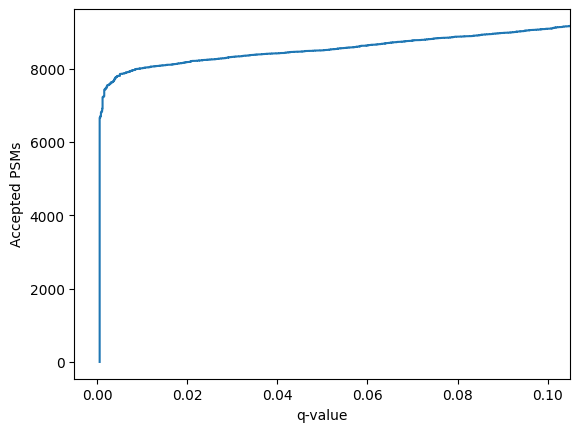

In [ ]:
confidence_results.plot_qvalues()
plt.show()

Or to compare the un-rescored PSMs to the rescored PSMs:

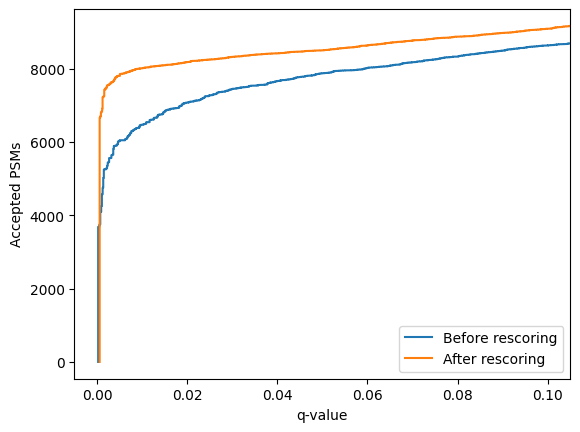

In [ ]:
linear_psm_dataset.assign_confidence().plot_qvalues(label="Before rescoring")
confidence_results.plot_qvalues(label="After rescoring")
plt.legend()
plt.show()

Using mokapot directly allows us to quickly generate `LinearPsmDataset` objects with different feature sets, for instance:

- Only basic features
- Basic + MaxQuant-derived features (mimicking a traditional Percolator rescoring run)
- Basic + MaxQuant-derived + MS²PIP features
- Basic + MaxQuant-derived + MS²PIP + DeepLC features


In [ ]:
feature_sets = {
    "basic": feature_names["basic"],
    "basic_mq": feature_names["basic"] + feature_names["maxquant"],
    "basic_mq_ms2pip": feature_names["basic"] + feature_names["maxquant"] + feature_names["ms2pip"],
    "basic_mq_ms2pip_deeplc": feature_names["basic"] + feature_names["maxquant"] + feature_names["ms2pip"] + feature_names["deeplc"],
}

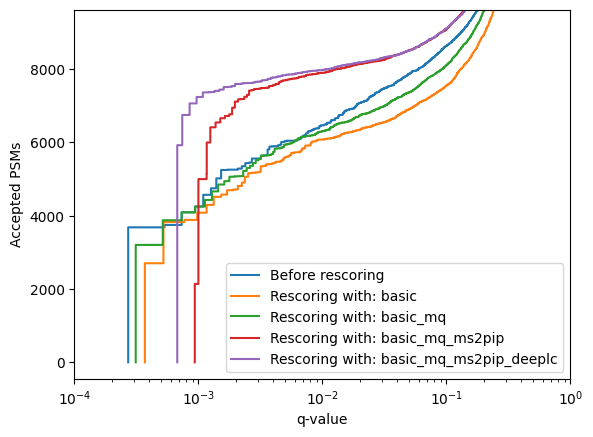

In [ ]:
linear_psm_dataset.assign_confidence().plot_qvalues(label="Before rescoring")

for feature_set, features in feature_sets.items():
    linear_psm_dataset = convert_psm_list(psm_list, features)
    confidence_results, models = brew(linear_psm_dataset)
    confidence_results.plot_qvalues(label=f"Rescoring with: {feature_set}")

plt.xscale('log')
plt.xlim(1e-4, 1)
plt.legend()
plt.show()

### Using Mokapot within MS²Rescore

Mokapot can also be used for rescoring with the higher-level integration in MS²Rescore. Simply pass
a PSMList object with rescoring features added to the `rescore` function. Doing so will automatically
convert the PSMList to a Mokapot `LinearPsmDataset`, run the `brew` function, and update the original
PSMList with the new scores, q-values and PEPs.

In [ ]:
from ms2rescore.rescoring_engines import mokapot

mokapot.rescore(psm_list)

In [ ]:
score_histogram(psm_list.to_dataframe())